In [3]:
import numpy as np
import os
import matplotlib.pyplot as plt
import soundfile as sf
import librosa
from prettytable import PrettyTable
from sklearn.decomposition import NMF
from IPython.display import Audio
from scipy.signal.windows import tukey, nuttall
from scipy.signal import resample

## Ventana hamming

Se define la ventana hamming de manera matemática.

In [5]:
def hamming_window(N):
    # Definición de la ventana hamming de modo que se pueda generar para un
    # largo de ventana definido
    return np.asarray([0.53836 - 0.46164*np.cos((2*np.pi*i)/N)
                       for i in range(int(N))])

## Ventana hann

Se define la ventana hann de manera matemática.

In [6]:
def hann_window(N):
    # Definición de la ventana hamming de modo que se pueda generar para un
    # largo de ventana definido
    return np.asarray([0.5 - 0.5*np.cos((2*np.pi*i)/N)
                       for i in range(int(N))])

# Definición de algunas funciones previas

En primer lugar, se define la función que creará el espectrograma, en conjunto con la función de espectrograma inverso.

## Espectrograma

In [7]:
def get_spectrogram(audio, samplerate, N=512, padding=512, overlap=0, window='tukey', whole=False):
    # Lista donde se almacenará los valores del espectrograma
    spect = []
    # Lista de tiempo
    times = []
    
    # Variables auxiliares
    t = 0   # Tiempo
    
    # Seleccionar ventana
    if window == 'tukey':
        wind_mask = tukey(N)
    elif window == 'hamming':
        wind_mask = hamming_window(N)
    elif window == 'hann':
        wind_mask = hann_window(N)
    elif window == 'nuttall':
        wind_mask = nuttall(N)
    elif window is None:
        wind_mask = np.array([1] * N)
    
    # Iteración sobre el audio
    while audio.any():
        # Se corta la cantidad de muestras que se necesite, o bien, las que se
        # puedan cortar
        if len(audio) >= N:
            q_samples = N
            step = int(N * (1 - overlap))
        else:
            break
            # q_samples = step = len(audio)
            
        # Recorte en la cantidad de muestras
        audio_frame = audio[:q_samples]
        audio = audio[step:]
               
        # Ventaneando
        audio_frame_wind = audio_frame * wind_mask
        
        # Aplicando padding
        audio_padded = np.append(audio_frame_wind, [0] * padding)
        
        # Aplicando transformada de fourier
        audio_fft = np.fft.fft(audio_padded)
               
        # Agregando a los vectores del espectro
        spect.append(audio_fft)
        
        # Agregando al vector de tiempo
        times.append(t)
        t += step/samplerate
    
    # Preguntar si se quiere el espectro completo, o solo la mitad (debido a que está reflejado
    # hermitianamente)
    if whole:
        # Generar el vector de frecuencias para cada ventana
        freqs = np.linspace(0, samplerate, N+padding)

        # Una vez obtenido el spect_mag y spect_pha, se pasa a matriz
        spect = np.array(spect, dtype=np.complex64)
    else:
        # Generar el vector de frecuencias para cada ventana
        freqs = np.linspace(0, samplerate//2, (N+padding)//2 + 1)

        # Una vez obtenido el spect_mag y spect_pha, se pasa a matriz
        spect = np.array(spect, dtype=np.complex64)[:, :(N+padding)//2 + 1]
    
    # Se retornan los valores que permiten construir el espectrograma correspondiente
    return times, freqs, spect.T

## Espectrograma inverso

In [8]:
def get_inverse_spectrogram(X, overlap=0, window='tukey', whole=False):
    # Preguntar si es que la señal está en el rango 0-samplerate. En caso de que no sea así,
    # se debe concatenar el conjugado de la señal para recuperar el espectro. Esto se hace así
    # debido a la propiedad de las señales reales que dice que la FT de una señal real entrega
    # una señal hermitiana (parte real par, parte imaginaria impar). Luego, como solo tenemos
    # la mitad de la señal, la otra parte correspondiente a la señal debiera ser la misma pero
    # conjugada, para que al transformar esta señal hermitiana mediante la IFT, se recupere una
    # señal real (correspondiente a la señal de audio).
    if not whole:
        # Se refleja lo existente utilizando el conjugado
        X = np.concatenate((X, np.flip(np.conj(X[1:-1, :]), axis=0)))
        
    # Obtener la dimensión de la matriz
    rows, cols = X.shape
    
    # Seleccionar ventana
    if window == 'tukey':
        wind_mask = tukey(rows)
    elif window == 'hamming':
        wind_mask = hamming_window(rows)
    elif window == 'hann':
        wind_mask = hann_window(rows)
    elif window == 'nuttall':
        wind_mask = nuttall(rows)
    elif window is None:
        wind_mask = np.array([1] * rows)
        
    # A partir del overlap, el tamaño de cada ventana de la fft (dimensión fila) y la cantidad de
    # frames a las que se les aplicó la transformación (dimensión columna), se define la cantidad
    # de muestras que representa la señal original
    step = int(rows * (1 - overlap))      # Tamaño del paso
    total_samples = step * cols + rows    # Tamaño total del arreglo
    
    # Definición de una lista en la que se almacena la transformada inversa
    inv_spect = np.zeros((total_samples,), dtype=np.complex128)
    # Definición de una lista de suma de ventanas cuadráticas en el tiempo
    sum_wind2 = np.zeros((total_samples,), dtype=np.complex128)
    
    # Transformando columna a columna (nótese la división en tiempo por una ventana definida)
    for i in range(cols):
        beg = i * step
        # Se multiplica por el kernel para la reconstrucción a partir de la ventana aplicada inicialmente
        # Fuente: https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.istft.html
        inv_spect[beg:beg+rows] += np.fft.ifft(X[:, i]) * wind_mask
        
        # Se suma la ventana al cuadrado (que sirve como ponderador temporal)
        sum_wind2[beg:beg+rows] += wind_mask ** 2
    
    # Finalmente se aplica la normalización por la cantidad de veces que se suma cada muestra
    # en el proceso anterior producto del traslape, utilizando las ventanas correspondientes
    return np.real(np.divide(inv_spect, sum_wind2 + 1e-15))

## Filtro de Wiener

In [9]:
def wiener_filter(V, WiHi, W, H, alpha=1):
    # El filtro de Wiener permite generar una máscara que obtenga información
    # del espectrograma original a partir de la proporción obtenida mediante la
    # multiplicación de las matrices W y H (estimación de la señal original)
    
    # Obteniendo la máscara
    mask = np.divide(WiHi ** alpha, np.matmul(W, H) + 1e-15)
    
    # Aplicando la máscara al espectrograma original, se obtiene el resultado
    # final del proceso de separación de fuentes
    return mask * V

## NMF a espectrograma

In [16]:
def nmf_to_spectrogram(audio, samplerate, n_components=2, N=4096, overlap=0.75,
                       padding=0, window='hamming', whole=False, alpha=1,
                       wiener_filt=True):
    # Definición de una lista que almacene las componentes
    components = []
    # Listas de valores de interés
    Y_list = []
    
    # Obteniendo el espectrograma
    t, f, S = get_spectrogram(audio, samplerate, N=N, padding=padding, 
                              overlap=overlap, window=window, whole=whole)
    
    # Definiendo la magnitud
    X = np.abs(S)
    
    # Definiendo el modelo de NMF
    model = NMF(n_components=n_components)#, beta_loss='itakura-saito', solver='mu')
    
    # Ajustando
    W = model.fit_transform(X)
    H = model.components_
    
    # Se define la función de transformación para Yi
    if wiener_filt:
        filt = lambda source_i: wiener_filter(X, source_i, W, H, alpha=alpha)
    else:
        filt = lambda source_i: source_i
    
    # Obteniendo las fuentes
    for i in range(n_components):
        source_i = np.outer(W[:,i], H[i])
        
        # Aplicando el filtro
        Yi = filt(source_i) * np.exp(1j * np.angle(S))
        
        # Y posteriormente la transformada inversa
        yi = get_inverse_spectrogram(Yi, overlap=overlap, window=window, 
                                     whole=whole)
        
        # Agregando a la lista de componentes
        components.append(yi)
        Y_list.append(Yi)
        
    return np.array(components), X, np.array(Y_list), W, H

# 126_1b1_Al_sc_Meditron.wav

In [11]:
# Lectura del audio
audio_mono, samplerate = sf.read('126_1b1_Al_sc_Meditron.wav')

# Escuchar
Audio(audio_mono, rate=samplerate)

<IPython.core.display.Javascript object>


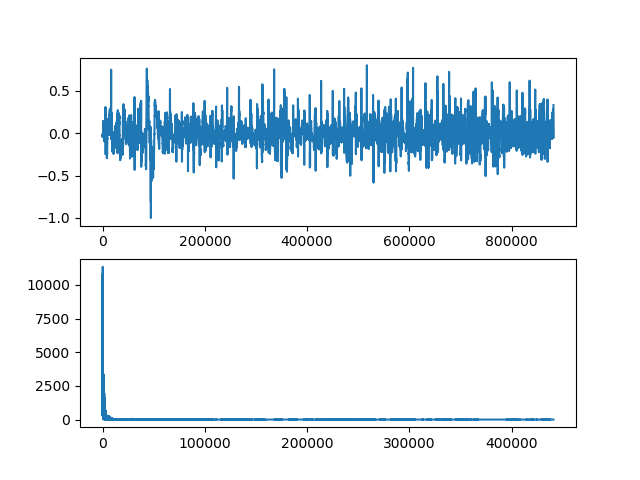

In [12]:
%matplotlib notebook
plt.subplot(2,1,1)
plt.plot(audio_mono)

plt.subplot(2,1,2)
plt.plot(abs(np.fft.fft(audio_mono))[:len(audio_mono)//2 + 1])
plt.show()

In [25]:
n_components = 3
N = 4096
overlap = 0.75
window='hamming'

comps, X, Y_list, W, H = nmf_to_spectrogram(audio_mono, samplerate, n_components=n_components,
                                         N=N, overlap=overlap, padding=0,
                                         window=window, whole=False, wiener_filt=True)

## Patrones reconocidos en la matriz $W$

<IPython.core.display.Javascript object>


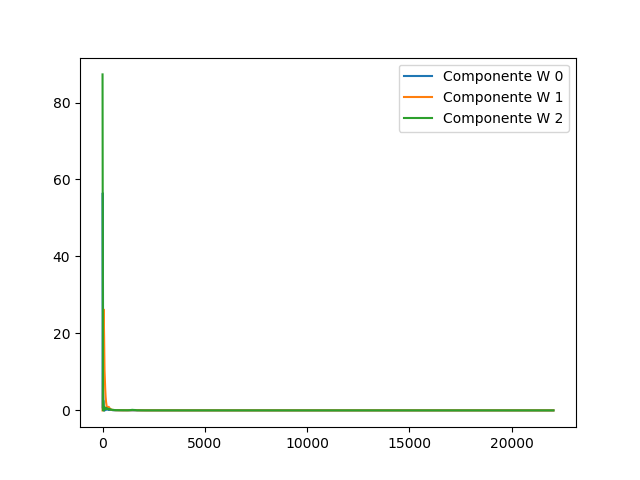

In [26]:
%matplotlib notebook
f = np.linspace(0, samplerate//2, N//2 + 1)

for i in range(n_components):
    plt.plot(f, W[:,i], label=f'Componente W {i}')
plt.legend()
plt.show()

## Patrones reconocidos en la matriz $H$

<IPython.core.display.Javascript object>


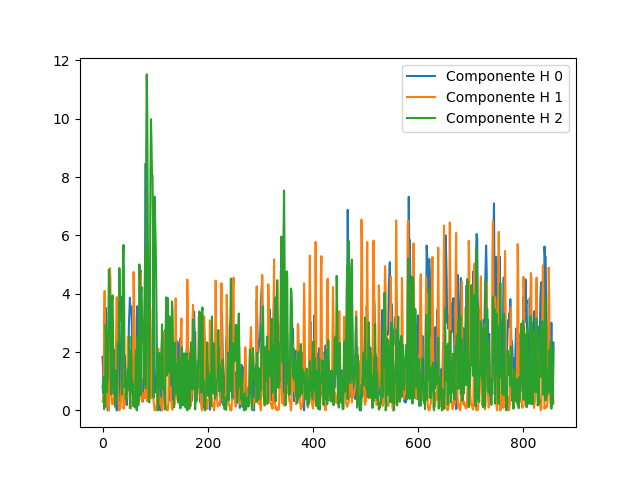

In [27]:
%matplotlib notebook
for i in range(n_components):
    plt.plot(H[i], label=f'Componente H {i}')
plt.legend()
plt.show()

<IPython.core.display.Javascript object>


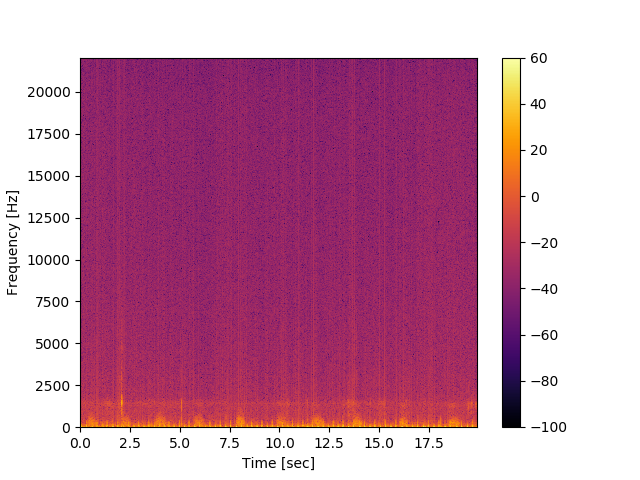

Text(0.5, 0, 'Time [sec]')

In [28]:
%matplotlib notebook
t, f, S = get_spectrogram(audio_mono, samplerate, N=N, padding=0, 
                          overlap=overlap, window=window, whole=False)

plt.pcolormesh(t, f, 20*np.log10(np.abs(S)), cmap='inferno')
plt.colorbar()
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [sec]')

c:\users\chris\appdata\local\programs\python\python36\lib\site-packages\ipykernel_launcher.py:2: RuntimeWarning: divide by zero encountered in log10
  


<IPython.core.display.Javascript object>


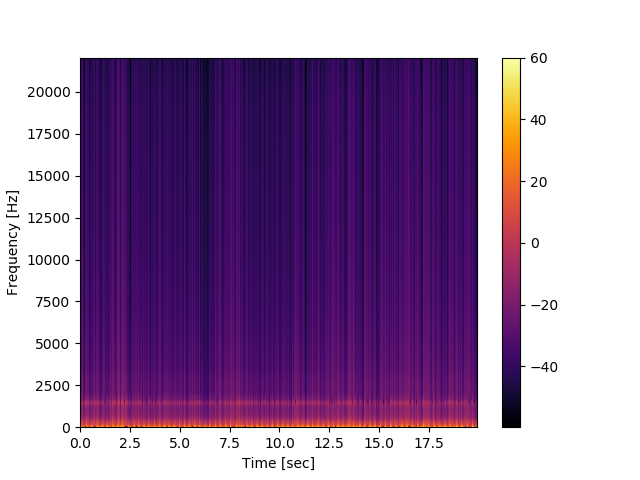

In [29]:
%matplotlib notebook
plt.pcolormesh(t, f, 20*np.log10(np.matmul(W,H)), cmap='inferno')
plt.colorbar()
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [sec]')
plt.show()

<IPython.core.display.Javascript object>


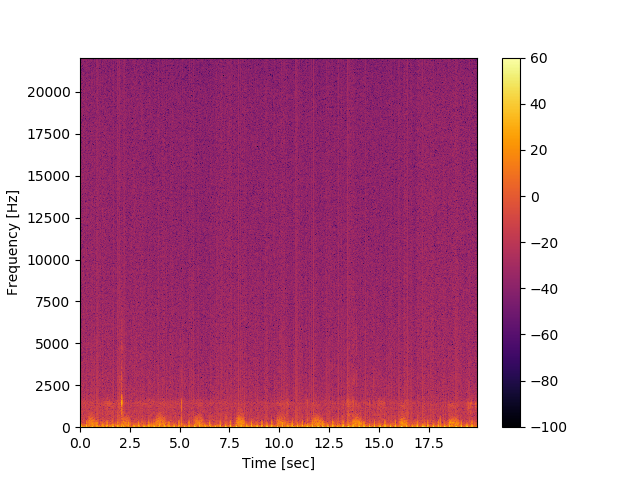

Text(0.5, 0, 'Time [sec]')

In [30]:
%matplotlib notebook
t, f, S1 = get_spectrogram(np.sum(comps, axis=0), samplerate, N=N, padding=0, 
                          overlap=overlap, window=window, whole=False)

plt.pcolormesh(t, f, 20*np.log10(np.abs(S1)), cmap='inferno')
plt.colorbar()
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [sec]')

In [52]:
# Escuchar
Audio(comps[0], rate=samplerate)

In [27]:
# Escuchar
Audio(comps[1], rate=samplerate)

In [53]:
# Escuchar
Audio(np.sum(comps, axis=0), rate=samplerate)